# Detecting Avalanche Paths using Remote Sensing Data

By: Mike Dorfman, Yoji High, and Ann Windnagel

## Summary

As part of a class project, we analyzed the effectiveness of detecting avalanche paths using a combination of remote sensing data. Avalanches are a natural hazard that can cause ecological impacts, property damage, transportation safety issues, and dangerous conditions for winter recreational activities. Because of the often extreme and remote terrain that avalanches can occur in, being able to detect possible avalanche paths from remote sensing data is advantageous because it allows for large scale analysis of these areas without humans having to go into dangerous terrain.

Avalanche over highway     |  Fallen trees due to avalanche  | Avalanche over a home
:-------------------------:|:-------------------------:|:-------------------------------:
<img src="https://townofalta.com/wp-content/uploads/2016/01/avalanche_debris.jpg" alt="Avalanche over highway" style="height:225px;"/> |  <img src="https://utahavalanchecenter.org/sites/default/files/images/avalanches/2013-14/BroadsForkCreekTrees.jpg" alt="Fallen Trees" style="height:225px;"/>  | <img src="http://factsanddetails.com/media/2/20120530-Avalanche%20after-Lanches250295-4.JPG" alt="Avalanche over a home" style="height:225px;"/>
Credit: Town of Alta, Utah                         | Credit: Utah Avalanche Center                                  | Credit: factsanddetails.com

## Literature Review

Nåfält (2016) and Renner (2015) both used a combination of slope and aspect derived from DEM data (along with several other factors) to generate an avalanche predictor score to varying degrees of success. While our study focused on using these two values to derive an avalanche score, the integration of curvature in both studies yielded a correlation stronger than just slope and aspect. Colorado Avalanche Center (2015) generated a histogram of slope angles compared to avalanche frequency and found that 94% of avalanches occur on slopes between 30 and 50 degrees. This signaled that the slope angle has the greatest impact on an avalanche.

Suk and Klimánek (2011) and Barlow and Franklin (2008) both use DEM and NDVI to perform supervised classifications to determine where avalanche paths may occur in the Krkonoše Mountains in Czechoslovakia and the Canadian Rockies, respectively. Both studies found that they were able to create maps that corresponded to real situations with Barlow and Franklin reporting an 80% accuracy. The analysis in these studies was slightly different from ours in that we used the NDVI to try and determine where avalanches had occurred instead of using it to determine where avalanches would not occur, as these studies did. Both studies chose a site location that already had the known avalanche paths mapped for validation of their work. Nåfält (2016) also used a method in order to separate out the start zone of the avalanche from the runout, as well as using ground vegetation classification, which while not yielding a statistically different predictor for avalanches, could be leveraged by our NDVI analysis in order to maximize the differences in vegetation by studying areas with a higher density of trees rather than lower growth vegetation and studying specifically the run-out zones.

Most studies aiming to determine a predictor for avalanche activity using remote sensing data beyond DEM-derived calculations have yielded inconclusive results, furthering the idea of avalanche risk and occurrence most accurately determined through field observations.

In [1]:
import os
import warnings
import matplotlib.pyplot as plt
from IPython.display import Image

import earthpy as et

import boundary_and_site_map as bsm
import common_functions as common
import naip_data_process as naip
import landsat_analysis as la
import DEM_Processing as dem_process 

# Turn off warnings so they don't clutter the notebook
warnings.filterwarnings("ignore")

# set working dir
os.chdir(os.path.join(et.io.HOME, 'earth-analytics'))

## Site Location
We chose Little Cottonwood Canyon along Highway 210 in Utah near Salt Lake City. According to the Utah Department of Transportation, Highway 210 has one of the highest rates of avalanches of any highway in the U.S. The Utah Avalanche Center (UAC) reported 277 avalanches within the 2010/2011, 2013/2014, and 2016/2017 avalanche seasons alone. It is also highly traveled by tourists and skiers heading to Alta and Snow Bird Ski Areas. Figure 1 shows a map of the general location of this site.

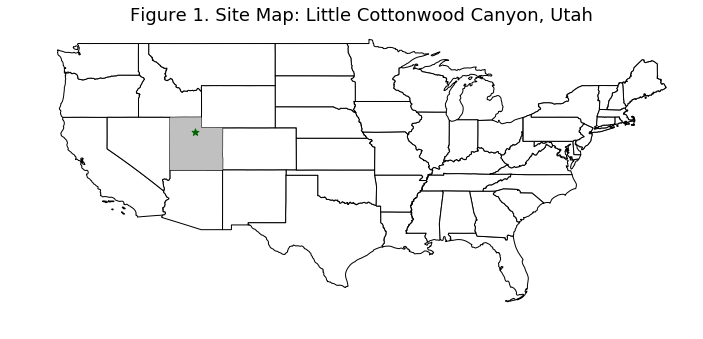

In [2]:
bsm.contextMap()
plt.show()

Figure 2 shows a view of the western end of Little Cotton Wood canyon looking East using Google Earth, with the known avalanche paths overlaid on top. Where data was available, the paths are labeled as to the probability of an avalanche occurrence. Highway 210 runs through the middle of this canyon.

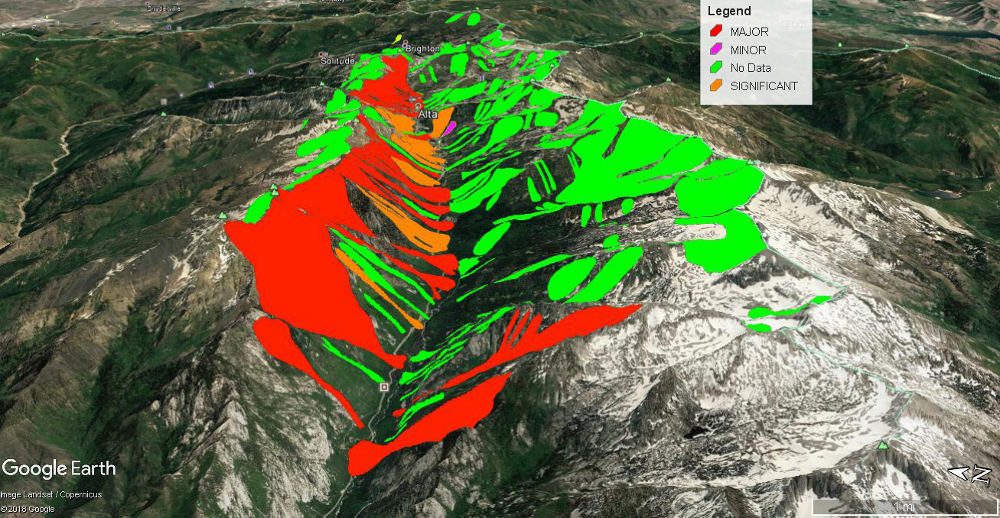

In [3]:
Image(filename = 'final-project/avalanche-mapping/images/avalanche_paths_google_earth.jpg')

**Figure 2. Avalanche Paths Over Google Earth**

## Methods
### Data Sources

We used three remote sensing data sources for this analysis and three other sources of data. The first source of remote sensing data came from the National Agricultural Imagery Program (NAIP) that is administered by the United States Department of Agriculture's (USDA) Farm Service Agency (FSA) using aircraft to take measurements in the visible and near-infrared at a 1 meter resolution. The second set of data came from the NASA Landsat 7 and 8 satellite at a 30 meter resolution. These data were acquired using the United States Geological Survey (USGS) [Earth Explorer](http://earthexplorer.usgs.gov) web application. The third set of remote sensing data is a Lidar Digital Elevation Model (DEM) from acquired from the [Utah Automated Geographic Reference Center](http://raster.utah.gov) (AGRC) at a 2 m resolution.

The other sources of data were a shapefiles of known avalanche paths in the Little Cottonwood Canyon site, snow accumulation data within that site, and avalanche occurrences and statistics in that site. The avalanche occurrence and statistics data were pulled from the Utah Avalanche Center's website by scrubbing the website for dates, size, and elevation of the avalanches. The tables below give the dates of the data sources.

Image Data                |  Dates        |   Resolution
:------------------------:|:-------------:|:--------------
NAIP                      | 10 Aug 2011 and 01 Jul 2014   | 1 m
Landsat 7/Landsat 8       | Jun-Sep 2008-2018 | 30 m
Lidar DEM                 | Nov 2008      | 2 m

Other Data         |  Dates        |   Source
:------------------------:|:-------------:|:--------------
Avalanche Path Shapefile  | Sep 1989   | Utah Automated Geographic Reference Center
Snow accumulation         | 2008-2018  | Utah Department of Transportation
Avalanche observations    | 2010-2011, 2013-2014, 2016-2017      | Utah Avalanche Center



### Analysis
We used two indicators of vegetation health, the Normalized Difference Vegetation Index (NDVI) and the Differenced Normalized Difference Vegetation Index (dNDVI), to analyze the NAIP and Landsat while combining that with elevations and slope from Lidar DEM data.

The NDVI is a measure of the greenness of vegetation that is computed from remote sensing data using a ratio of the visible and near-infrared light reflected by vegetation. The values of the index range from -1 to 1 where values close to 1 signify healthy vegetation, values close to 0 represents unhealthy vegetation, and values close to -1 represent water or rock. The equation for NDVI is the following:

$$
NDVI = \frac{NIR - Red}{NIR + Red}
$$

The dNDVI is a difference of two instances of NDVI in time. It is used to compare vegetation health after a natural disaster such as an avalanche. It is assumed that after an avalanche, the vegetation will have been damaged and will show a lower NDVI which will be easily seen by differencing the NDVI before the avalanche and the NDVI after the avalanche.

The Lidar DEM data allowed us to map slope, aspect, and elevation of the Little Cottonwood Canyon terrain. This is invaluable in determining avalanche paths as avalanche paths are highly correlated to slope angle and aspect.

Below is an in-depth description of the NAIP, Landsat, and DEM analysis.

### NAIP Analysis

#### Purpose
The purpose of analyzing the NAIP data was to determine if computing NDVI from high resolution NAIP data can be used to detect avalanche paths and to see if it's any more effective than using the lower resolution Landsat data. In addition, we also wanted to determine if there is a difference in NDVI within known avalanche paths and outside those paths.

#### Methods
The steps used to process the NAIP data are the following:
* Acquired NAIP data from USGS Earth Explorer. Because our study site is rather large, six NAIP scenes were needed to cover the area for the August 2011 data and nine NAIP scenes were required for the July 2014 data. 
* Merged the six 2011 scenes and the nine 2014 scenes were into one scene for each year and then cropped to our site boundary area. 
* Computed the NDVI of each cropped scene and overlaid the avalanche paths on top of the NDVI data. 
* Computed the mean NDVI within the avalanche paths and outside the avalanche and compared them to see if there is any correlation between NDVI and avalanche paths.

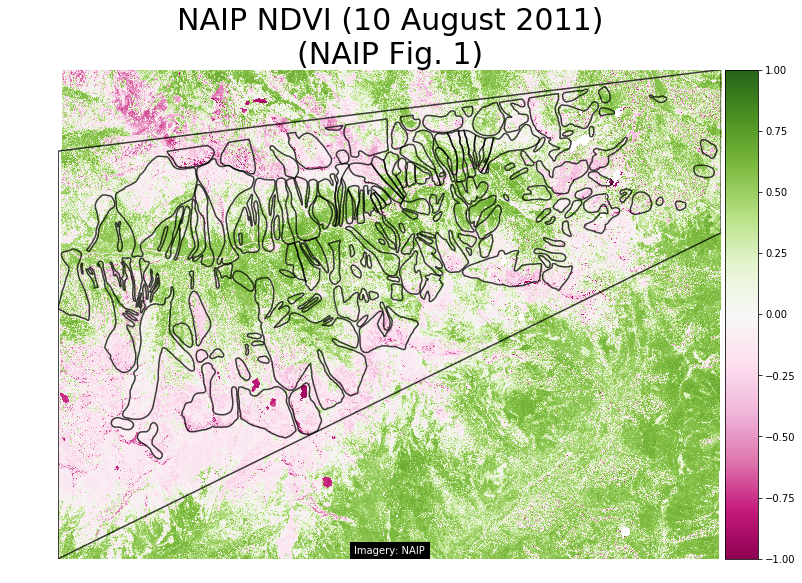

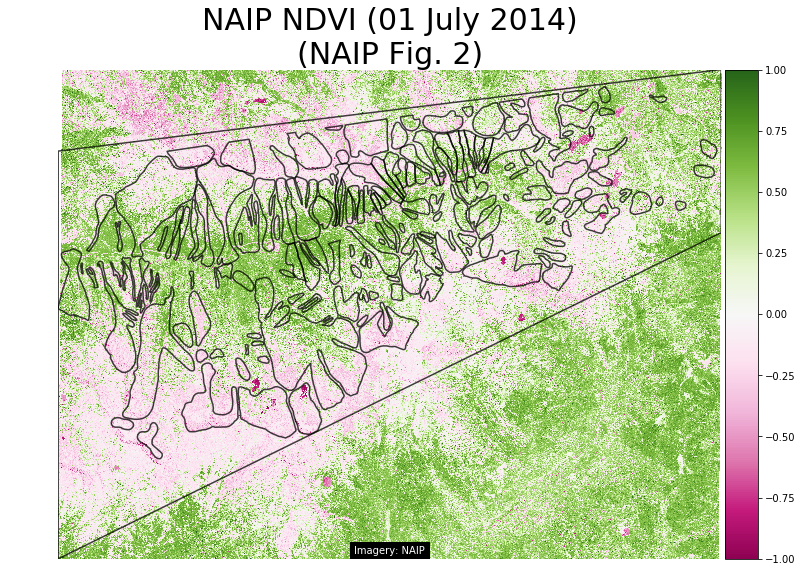

In [4]:
# Compute and Plot the NAIP NDVI
ndvi_2011_mosaic = naip.plotNDVI('2011', 'NAIP NDVI (10 August 2011)\n(NAIP Fig. 1)', 'Imagery: NAIP')
ndvi_2014_mosaic = naip.plotNDVI('2014', 'NAIP NDVI (01 July 2014)\n(NAIP Fig. 2)', 'Imagery: NAIP')

NAIP Fig. 1 and NAIP Fig 2., above, show the NDVI for two NAIP data scenes for the Little Cottonwood Canyon on 10 August 2011 and 01 July 2014, respectively. You can see that some of the avalanche paths do have lower NDVI but some also have very high NDVI close to 1 which means the vegetation health within the path is good. In addition, there are areas outside the paths that also have a large range of NDVI.

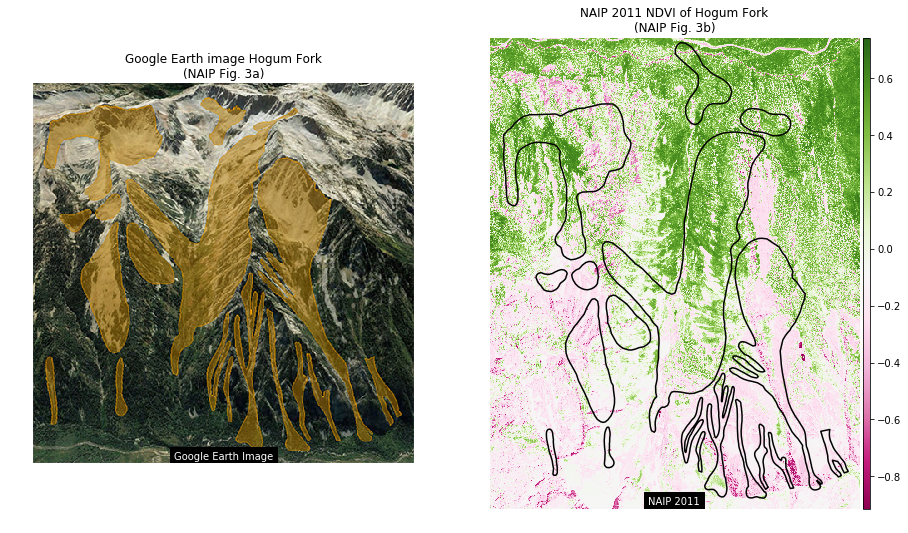

In [5]:
# Plot the Hogum fork NAIP NDVI and Google Earth Image
google_earth_fn = os.path.join('final-project', 'avalanche-mapping', 'images', 'hogum-fork-avi-path-google-earth.png')
mosaic_2011_fp = os.path.join('data', 'final-project', 'cottonwood-heights-utah',
                              'naip', 'outputs', 'naip_2011_mosaic_crop.tif')
naip.plotHogumFork(mosaic_2011_fp, google_earth_fn)
plt.show()

NAIP Fig. 3a and 3b shows a subsection of the Little Cottonwood Canyon called Hogum Fork. On the left is a Google Earth image of the area and on the right is the NAIP NDVI both with the avalanche paths overlaid on top. This just provides a close up of our analysis and provides a context of the terrain that makes up the area.

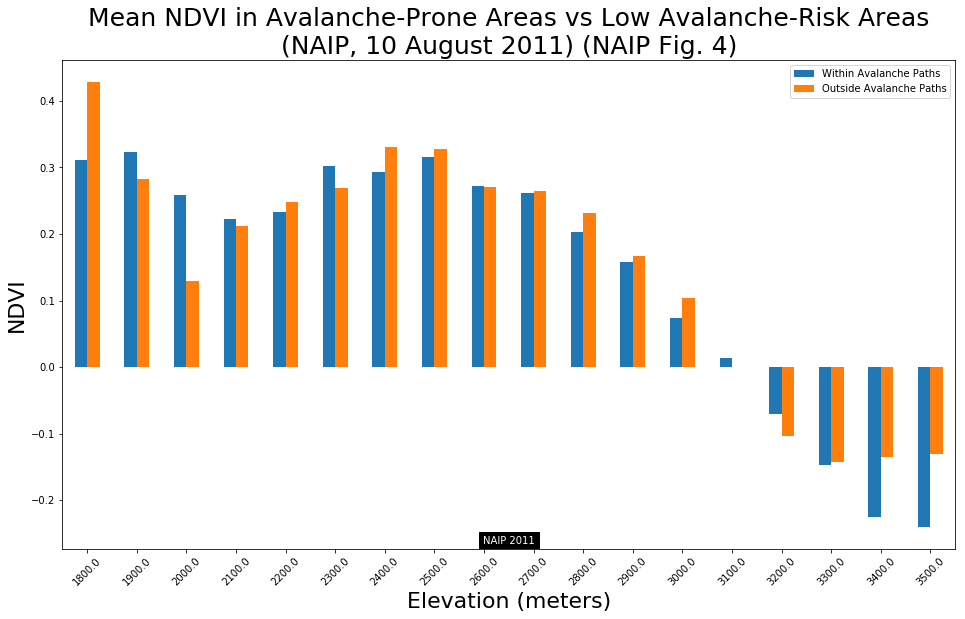

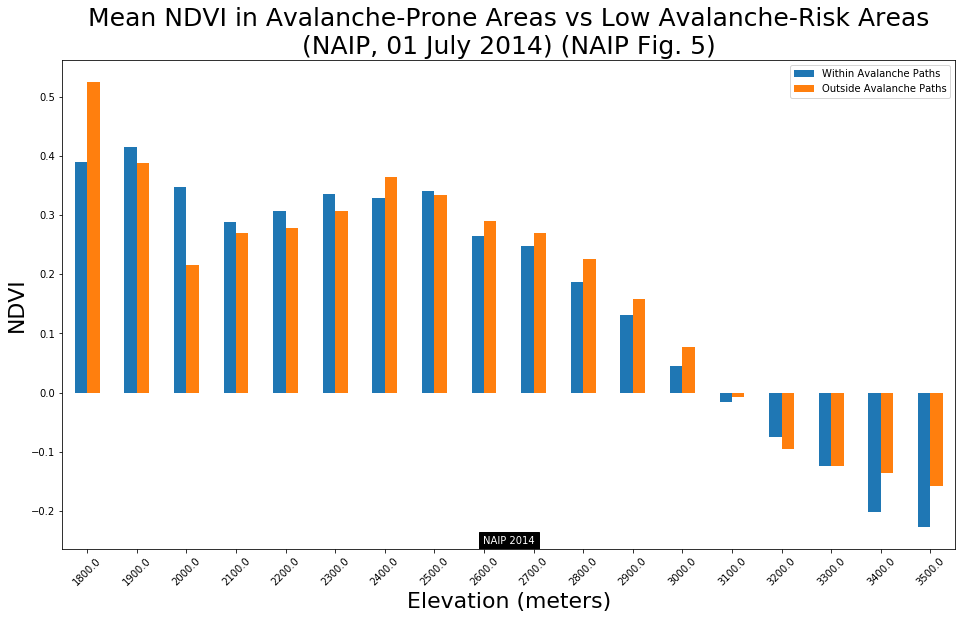

In [6]:
naip.compareMeanNDVI('2011', ndvi_2011_mosaic)
naip.compareMeanNDVI('2014', ndvi_2014_mosaic)

NAIP Fig. 4 and NAIP Fig. 5 show the distribution of the mean NDVI within the avalanche paths of Little Cottonwood Canyon and outside the paths. These graphs confirm that there is little correlation between NDVI and avalanche paths. We do, however, see a pattern of decreasing NDVI from 2000 m and higher but this makes sense as vegetation generally decreases at elevation increases.

### Landsat Analysis

#### Purpose
The purpose of analyzing the Landsat data was to determine the correlation between mean NDVI values and avalanche paths. In addition, also determine whether there is a relationship between change in mean summertime NDVI (analyzing NDVI within predetermined avalanche paths and outside of predetermined avalanche paths separately) and snowfall during the prior winter.
   
#### Methods
The steps used to process the Landsat data are the following:
* Generate elevation shapes representing every 100 meters in elevation.
* Find the union of these elevation shapes and the avalanche shapes.
* Collect and crop Landsat 7 or 8 scenes from summer-representative months (in this case, July-September).
* For each scene:
    - Determine the NDVI for each scene.
    - Mask scene by invalid values, clouds, water and snow.
* Calculate the maximum NDVI for each pixel over all scenes (minimizes the effect of low bias when you have snow in the scene).
* Using rasterstats, determine the mean NDVI in each elevation bucket that is within an avalanche shape and that is outside an avalanche shape.
* Plot NDVI data:
    - Plot NDVI data in a Choropleth map, with the color of each elevation bucket within each avalanche path representing the NDVI within that path to demonstrate the relationship between NDVI and elevation (see _Landsat fig 1_).
    - Plot NDVI data in a 2-series bar plot to connect both the elevation-NDVI relationship as well as to highlight any variations there may be in mean in-avalanche-path NDVI compared to out-of-avalanche-path NDVI in each elevation bucket (see _Landsat fig 3_).
    - Plot NDVI data in a Choropleth map, with the color of each elevation bucket within each avalanche path representing mean NDVI outside of avalanche paths subtracted from each avalanche path's NDVI at each elevation bucket (see _Landsat fig 2_).
* Determine the difference between the maximum NDVI pixels and the minimum NDVI pixels throughout the study period.
* Determine the annual dNDVI below a height threshold.
* Plot dNDVI data:
    * Plot the absolute difference in NDVI over the study period (see _Landsat fig 4_).
    * Plot a 3-series, dual-axis bar-and-line plot (in-avalanche and out-of-avalanche) representing the annual dNDVI and the total snowfall the winter prior (see _Landsat fig 5_)

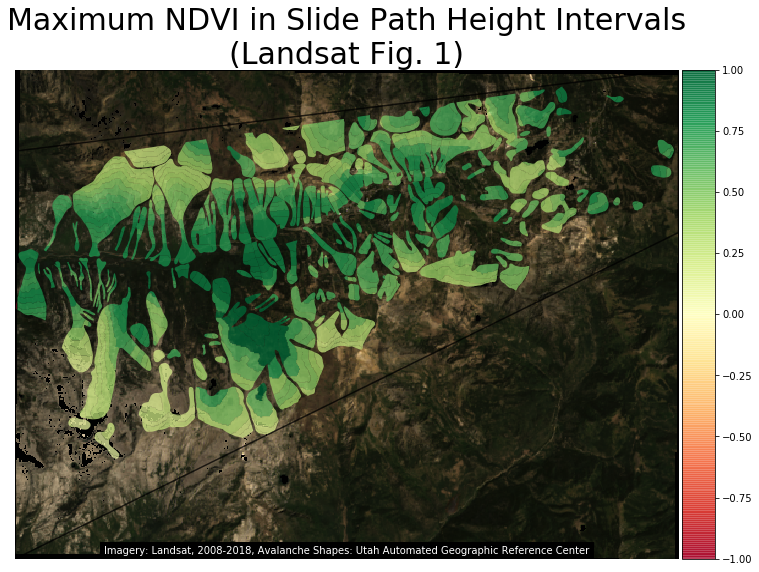

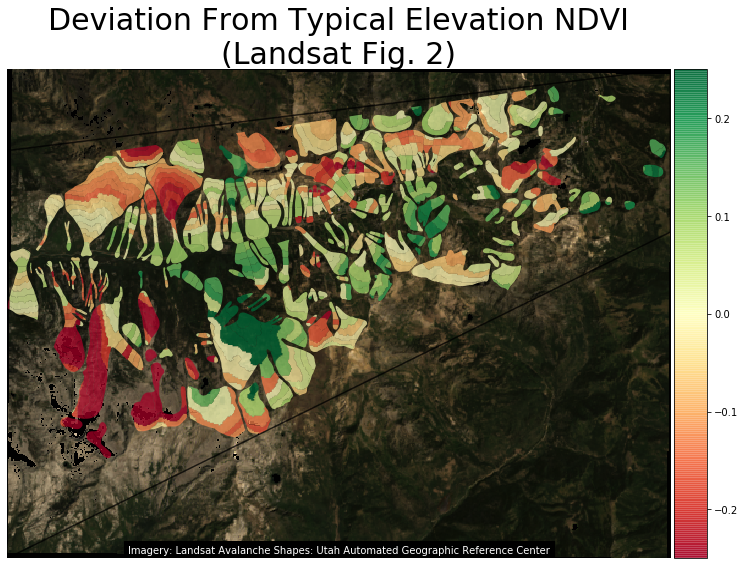

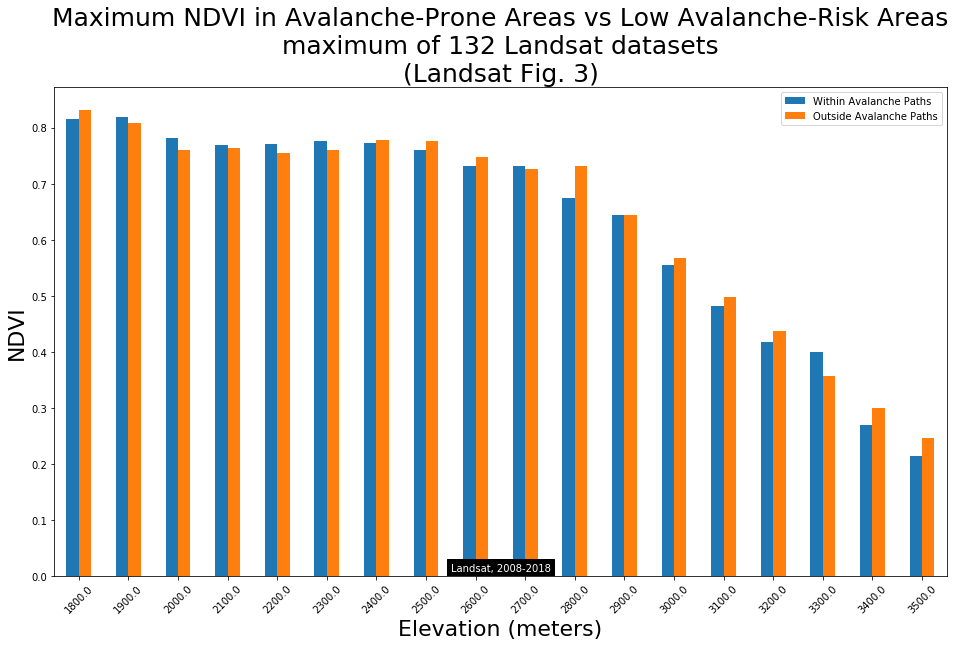

In [7]:
la.create_archive_from_tgz(la.landsat_raw_data, la.landsat_file_root)
ndvi_df = la.generate_ndvi()
avalanche_overlap_shape = la.generate_avalanche_shapes(ndvi_df.crs)
la.ndvi_analysis(ndvi_df, avalanche_overlap_shape)

#### Landsat Fig. 1
This choropleth map shows the strong relationship between elevation and NDVI.  It indicates that a elevation-normalized analysis is necessary when determining NDVI signals in avalanche paths.

#### Landsat Fig. 2
This choropleth map shows the relative difference in NDVI in each shape (shape mean NDVI - mean NDVI for that elevation bucket outside of avalanche shapes).  It shows a consistent depression in NDVI above tree line but mixed signals below tree line.

#### Landsat Fig. 3
This plot shows the NDVI in avalanche paths vs NDVI outside of avalanche paths for distinct elevation buckets.  Similar to Landsat Fig. 2, it shows a consistently lower NDVI in avalanche paths compared to outside avalanche paths above treeline, but no strong signal below treeline.

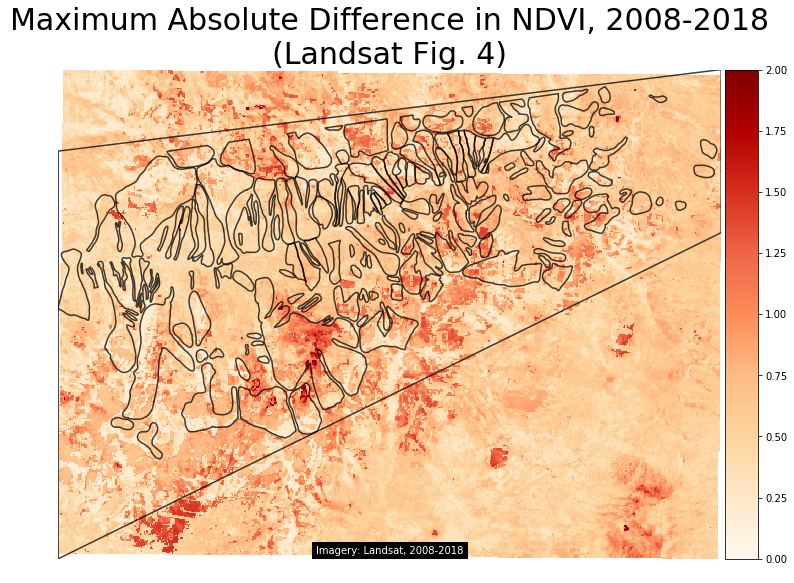

In [8]:
la.calculate_maximum_diff(ndvi_df)

#### Landsat Fig. 4
This plot shows the maximum difference in NDVI over the study period.  Our hypothesis would support larger deviations in NDVI below treeline and at the base of the avalanche paths, however this plot does not show any correlation between dNDVI and avalanche paths.

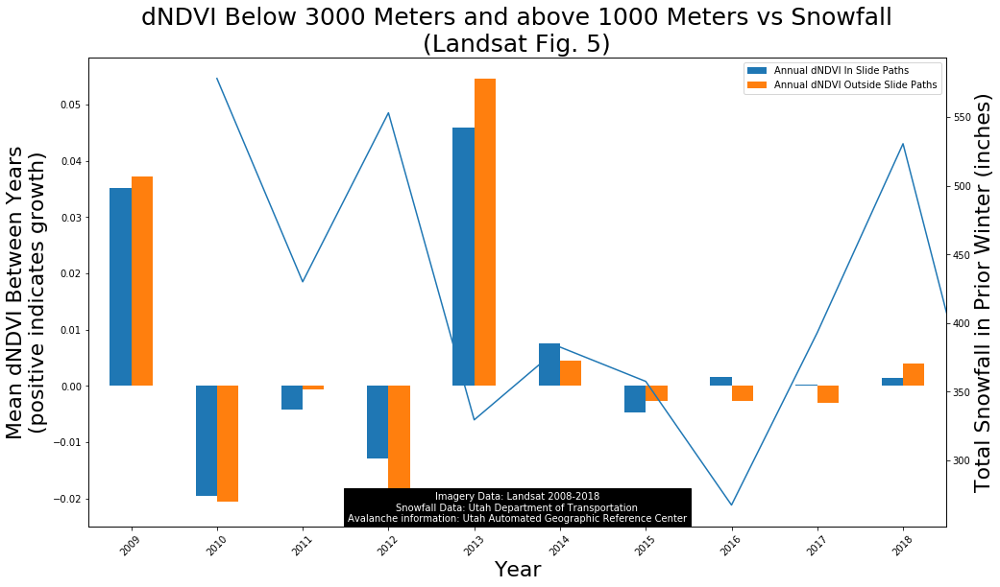

In [9]:
dndvi_df = la.generate_dndvi(ndvi_df, avalanche_overlap_shape)
_ = la.dndvi_analysis(dndvi_df)

#### Landsat Fig. 5
This plot shows the relationship between NDVI (separating out "inside-avalanche-path" and "outside-avalanche-path") and snowfall the winter prior, specifically analyzing areas below treeline.  The hypothesis would show a correlation between snowfall and negative dNDVI, however there is seemingly very little correlation between these factors.  Of particular importance is the scale of the left y-axis; the deviations from year to year are very small and other drivers likely have a greater effect on this value.

### DEM Analysis

#### Purpose
The purpose of the DEM Analysis was to determine the correlation between slope/aspect and avalanche paths through an aggregate avalanche danger score. In addition, we also wanted to determine whether there are known avalanche paths that may retrigger a slide more often based on danger values.
   
#### Methods
The steps used to process the DEM data are the following:
* Find the 2km x 2km DEM tiles of 2m LIDAR DEM data that correspond to our study area from Utah AGRC (raster.utah.gov)
* Download the raw DEM data in ascii format
* Merge rectangular groups of tiles together to form intermediate images.
* For intermediate image:
    - Mask nodata values
    - Write the new array to an intermediate geotiff file.
* Merge the intermediate geotiff files together using rasterio to create our final DEM array.
* Plot DEM data (see _DEM Figure 1_)
* Calculate slope and aspect using the built-in DEM analysis tools in richdem
    - Plot Slope values (see _DEM Figure 2_)
    - Plot Aspect values (see _DEM Figure 3_)
* Calculate an avalanche danger score using a weighted average of slope and aspect for each pixel.
    - 75% weight on slope:
        - Values between 0-25 and 55+: 1 (Lowest danger)
        - Values between 25-35 and 45-55: 2 (Medium danger)
        - Values between 35-45: 3 (Highest danger)
    - 25% weight on aspect
        - Values between 0-45, 315-360: 3 (North, highest danger)
        - Values between 45-225: 2 (South and East, medium danger)
        - Values between 225-315: 1 (West, lowest danger)
* Reclassify the avalanche danger score raster using np.digitize to five distinct buckets
* Plot reclassified danger score over the avalanche shapefiles (See _DEM Figure 4_) to determine if there is a visually higher danger score within the known avalanche paths.
* On the same plot (See _DEM Figure 4_), plot the site of 117 avalanches from the 2011, 2014, and 2017 season to determine if the starting point of the field sites correlate with areas of higher danger
* Determine the mean danger score within each avalanche path and plot them on a ranked scale with yellow being the lowest and red being the highest mean danger score:
    - Merge the shapefile metadata to the avalanche paths dataframe using site area as the key.
    - Using rasterstats, calculate the mean danger score within each shapefile
    - Plot using the above scale (See _DEM Figure 5_)

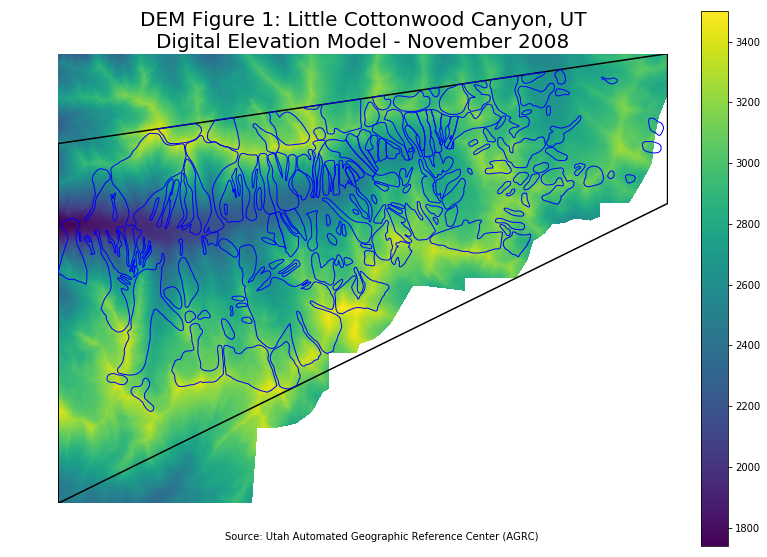

In [10]:
output_file = os.path.join('final-project', 'avalanche-mapping', 'data', 'DEM', 'modified', "Final.tif")
image = dem_process.DEM_Plot(output_file)[0]

#### DEM Fig. 1
This plot shows the digital elevation model in our study area. The overlaid avalanche shapes show a visual indication that many of these slides take place from the peaks on either side of Highway 210 down to the valley.

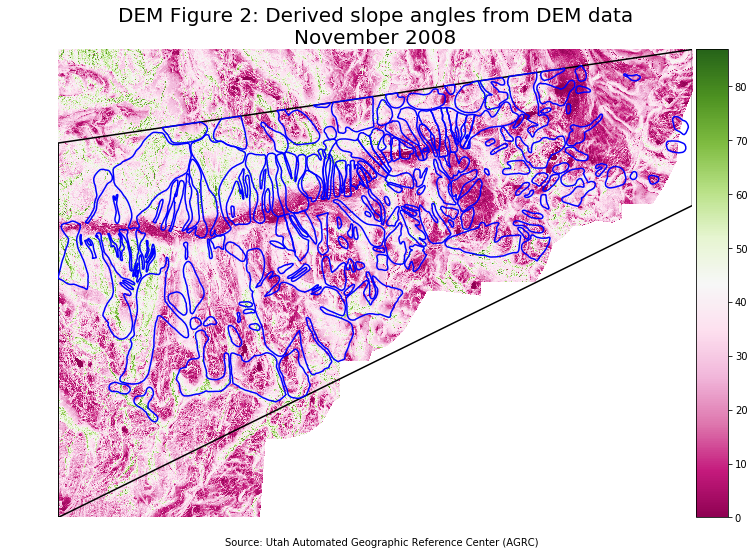

In [11]:
slope_ma = dem_process.Slope_Plot(output_file)[1]

#### DEM Fig. 2
This plot shows the slope angles within our study area. Of note is that many of the avalanche paths enclose areas that have higher slope angles (40-50 degrees), which is consistent with the understanding of which slope angles are prone to slide more than others.

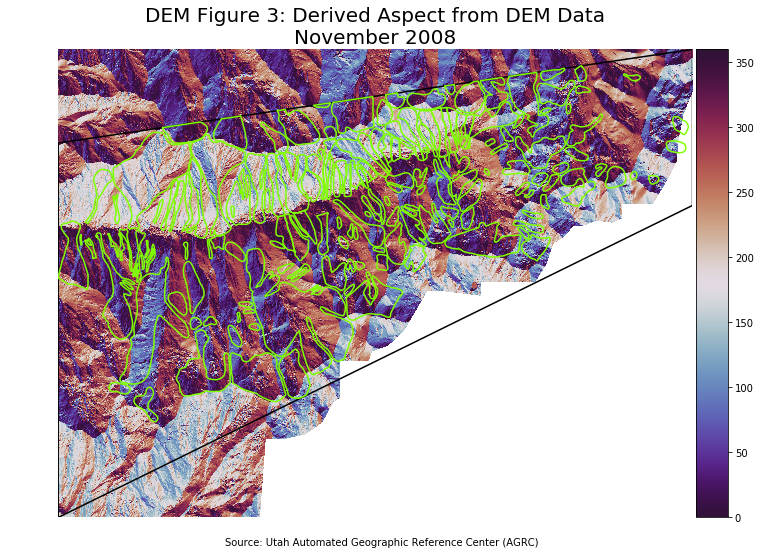

In [12]:
aspect_ma = dem_process.Aspect_Plot(output_file)[1]

#### DEM Fig. 3
This plot shows the hill aspect within our study area. Many of the avalanche paths take place on the south-facing side of Little Cottonwood Canyon, but the overall coverage of the paths over our study area limits the useful analysis possible based on whether a specific slope is prone to slide.

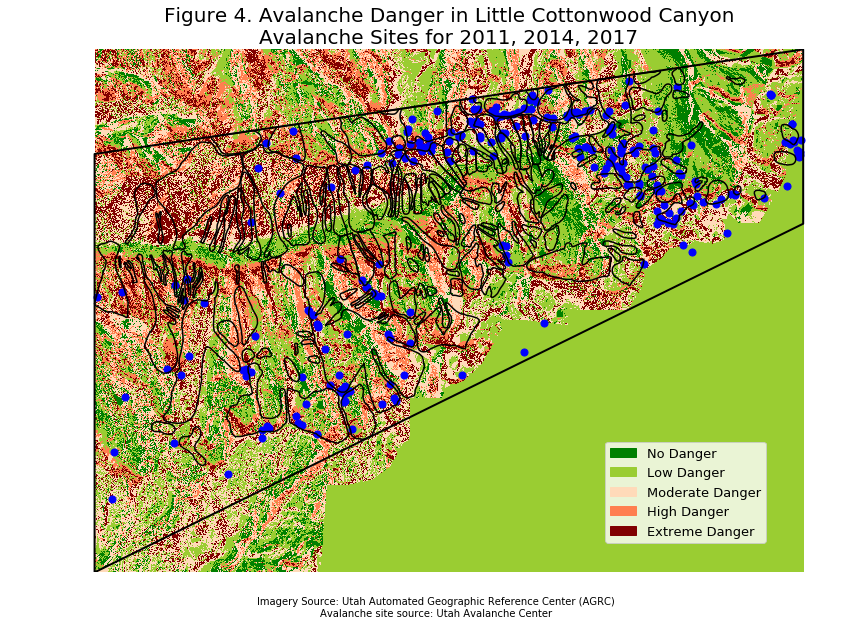

In [13]:
avy_danger_class = dem_process.Danger_Plot(slope_ma,aspect_ma)

#### DEM Fig. 4
This plot shows the avalanche danger score across our study area. There is a higher danger overall on the slopes immediately above the canyon floor, and some of the slide paths fill neatly into higher areas of overall danger, which shows that slope and aspect combined using our formula is at least able to correlate with previous avalanche areas. The blue dots on the plot represent 277 prior avalanches from field studies. The location of the dot is the start zone of the avalanche, and there does seem to be a general correlation between the start zone and the higher danger score near the start zone of the known avalanche paths.

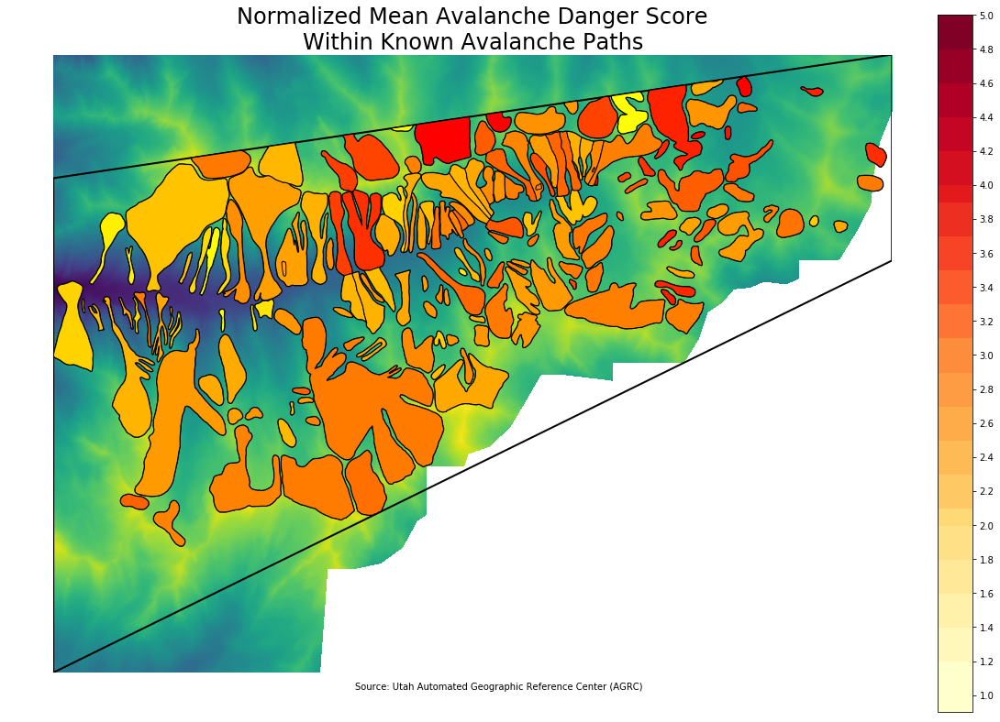

In [14]:
mean_danger = dem_process.Mean_Danger(output_file, avy_danger_class)
dem_process.Normalized_mean_danger(image, mean_danger)

#### DEM Fig. 5
This plot shows the mean danger score within each avalanche path, and the scores are plotted on a yellow to red scale. Some of the highest mean scores were from the avalanches on the north edge of our study area, near the peaks of the mountains on the north side of the canyon. Comparing it to the slope and aspect profiles, we can see that most of these areas have higher slope angles as well as facing north. We were aiming to determine which avalanche paths we could study further during our NDVI analysis using this DEM analysis, but due to time constraints, we were not able to leverage this data.

## Results and Conclusions
Our hypothesis for this study was that we would find a correlation between avalanche paths and NDVI/dNDVI due to vegetation damage from the physical trauma of the avalanches. After analyzing the NAIP and Landsat NDVI/dNDVI data, we found very little correlation between vegetation health and predetermined avalanche paths.  

Our study of the high-resolution NAIP data indicated that NDVI was highly dependent on elevation, as is evident in the elevation buckets vs mean NAIP NDVI graph above (NAIP Fig. 4 and NAIP Fig. 5). There are several factors potentially contributing to this, with the two most prominent being a decrease in vegetation and increase in rocks in ground cover as well as lingering alpine snow decreasing the NDVI. Upon analysis of NDVI within avalanche paths and NDVI outside of avalanche paths, it was found that the NAIP data did not support our hypothesis. The mean NDVI within each avalanche path and within all other non-avalanche-path terrain at that elevation was very similar.

After finding very little correlation between slide paths and NDVI in general, we examined a slide path that seemed obvious in the satellite image (using RGB bands).  In this slide path, the equivalent NDVI image showed very little indicator of the vegetation change (NAIP Fig. 3b).

Similar to the NAIP data, the Landsat NDVI data was highly dependent on elevation. For this reason, an elevation-bucketed analysis was required. After bucketing elevations, it was found that NDVI had consistent lower values in avalanche tracks above 2000 meters. However, this was likely not caused by the hypothesized driver - damage to vegetation from the physical trauma of avalanches. This terrain was almost entirely above treeline, so trauma to vegetation from avalanches would be unlikely when the vegetation is short enough to be buried in snow throughout the winter. These avalanche paths are more likely to occur on steeper slopes, averaging 45 degrees. These steep slopes will also suppress the growth of vegetation, decreasing the NDVI in these areas.

Below 2000 meters, mixed results were found in the deviation between NDVI in-avalanche-path and NDVI out-of-avalanche-path.  Similar to the NAIP data, some paths contained a strong signal for decreased NDVI, but physically examining those paths showed other natural factors (not damage to vegetation) that caused this suppression.  We concluded that there was no strong signal correlating damage in vegetation as measured by NDVI with avalanches.

The advantages Landsat data had over NAIP was the ability to do a thorough time analysis of NDVI. To simplify the time analysis, all NDVI below treeline was analyzed in two categories; in-slide-path and out-of-slide-path. The annual dNDVI was then determined by subtracting the prior year from the current year for each year over the study period. These two categories in difference in annual NDVI were then plotted against total snowfall the year prior (Landsat Fig. 5). The hypothesis of a correlation between snowfall and suppressed dNDVI proved inconclusive after analyzing the data, as prior snowfall and dNDVI do not seem correlated. 

In addition, we analyzed 2-meter resolution Digital Elevation Model data. From this data, we were able to generate a slope and aspect raster that could then be used to determine an avalanche danger rating. This helped us determine which avalanche paths were higher-risk and which were lower-risk to allow us to compare different avalanche sizes with vegetation damage, as indicated by NDVI. In addition, we analyzed recorded avalanche activity to help us understand where avalanches were more likely to occur.  Ultimately, these data were helpful as background information but not used directly in the NDVI or dNDVI study, as no general correlation was found between avalanche paths and NDVI/dNDVI.

While our results did not directly support this hypothesis, they gave us an interesting insight into the complexity of NDVI in mountainous regions, which was highly correlated to elevation and other factors. We did note that there are sources of uncertainty and noise in our data. These include lingering snowpack on the ground, uneven greenness, unfiltered cloud cover, natural features where NDVI varied spatially (eg landslides). While the support of our hypothesis proved to be inconclusive, additional normalization for other factors as well as more thorough and manual data cleaning and slide path designation may reveal a previously-hidden signal between NDVI/dNDVI and avalanche paths.  

## Future studies
### Replace the avalanche paths with a physical model to define the paths with higher resolution.
One potential source of error is the assumed "ground truth" of the avalanche paths.  By generating new avalanche paths based on a physical model and observations, one could potentially make an avalanche path that is much more consistent with reality.

### Study the vegetation change within a buffer around an avalanche path boundary instead of a general mean in-path/out-of-path NDVI value
Our study focused on the difference in in-avalanche-path vegetation health vs out-of-avalanche-path vegetation health.  Another potential indicator would be the gradient of vegetation health and/or vegetation types around the edge of avalanche path.

### Perform a case study on an area that has had avalanche damage.
While avalanches can often generate a large amount of damage, we were not able to visually find any fresh damage in our study area during our study period.  Examining such damage could help us generate a better predictor for these types of events.

### Analyze green-up over a summer and only use one landsat scene per year, which represents maximum greenness for analysis.
While there was a lot of landsat data, aggregating different frames which were partially obscured by clouds made for messy and potentially inaccurate assumptions.  Using a single, cloud-free frame and normalizing this frame to the "maximum greenness" would eliminate some of these challenges associated with aggregating a summers' worth of Landsat data.

### Investigate the relationship between slope angle and NDVI above treeline.
Our Landsat study indicated a depression in NDVI inside avalanche paths above treeline.  This is likely not caused by physical trauma of avalanches and instead the relationship between avalanche paths, slope angle and NDVI.  Generate a slope angle vs NDVI and avalanche path vs slope angle plot to confirm this relationship and tune up/down the analyzed NDVI based on the slope angle.

### Perform study in a different location with avalanche paths that run further below treeline.
This study area was chosen for its thorough avalanche track data.  However, it may be more beneficial (albeit more time consuming) to perform this study in a different location with more paths that run further below treeline.  More damage, and a greater NDVI depression, within avalanche tracks would then be more likely.

### Use an indicator other than NDVI
As indicated above, it is fairly easy to recognize an avalanche path using RGB data.  Use another band, or combination of bands, instead of NDVI to help determine where avalanche paths may be. We could also use NDVI in another way. One such method that has been used in other research, mentioned in the Literature Review section above, is to use NDVI to categorize vegetation type, then use this vegetation type to determine where avalanche paths are not likely to occur.

## References
Colorado Avalanche Information Center. “Statistics and Reporting.” Colorado Avalanche Information Center. Web. 27 Nov. 2018

Barlow, J., & Franklin, S. E. (2008). Mapping snow avalanche chutes in the Canadian Rockies using Landsat TM and DEM data. Canadian Journal of Remote Sensing, 34(6), 516-525.

Nåfält, S. (2016). Assessing avalanche risk by terrain analysis: An experimental GIS-approach to The Avalanche Terrain Exposure Scale (ATES). Department of Physical Geography and Ecosystem Science Lund University.

Renner, K. (2015). Avalanche Risk Terran Susceptibility. Utah State University Department of Geography.

Suk, P. and M. Klimánek. (2011). Creation of the snow avalanche susceptibility map of the Krkonoše Mountains using GIS. Acta Universitatis Agriculturae et Silviculturae Mendelianae Brunensis, 59(5), 237-246.